# Evaluation of distribution of models on 60km -> 2.2km-4x over Birmingham

In [ ]:
%reload_ext autoreload

%autoreload 2

%reload_ext dotenv
%dotenv

In [ ]:
from mlde_analysis.default_params import *

In [ ]:
# Parameters
desc = "Comparison of diffusion model for CPMGEM-pr paper\nTest split\n12em dataset and models, 60km inputs -> 8.8km outputs, pSTV input variable set\nCompare techniques: diffusion, u-net, bilinear\n"
eval_vars = ["pr"]
derived_variables_config = {}
dataset_configs = {
    "CPM": "bham64_ccpm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
    "GCM": "bham64_gcm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
}
split = "test"
ensemble_members = [
    "01",
    "04",
    "05",
    "06",
    "07",
    "08",
    "09",
    "10",
    "11",
    "12",
    "13",
    "15",
]
samples_per_run = 6
sample_configs = {
    "CPM": [
        {
            "label": "CPMGEM_cCPM",
            "sample_specs": [
                {
                    "fq_model_id": "score-sde/subvpsde/ukcp_local_pr_12em_cncsnpp_continuous/bham-4x_12em_pSTV",
                    "checkpoint": "epoch_20",
                    "input_xfm": "bham64_ccpm-4x_12em_psl-sphum4th-temp4th-vort4th_pr-stan",
                    "dataset": "bham64_ccpm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
                    "variables": ["pr"],
                }
            ],
            "deterministic": False,
            "CCS": True,
            "color": "tab:blue",
            "order": 11,
        },
        {
            "label": "U-Net_cCPM",
            "sample_specs": [
                {
                    "fq_model_id": "score-sde/deterministic/ukcp_local_pr_12em_plain_unet/bham_pSTV-ema-gradcl-256-batch",
                    "checkpoint": "epoch_100",
                    "input_xfm": "bham64_ccpm-4x_12em_psl-sphum4th-temp4th-vort4th_pr-stan",
                    "dataset": "bham64_ccpm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
                    "variables": ["pr"],
                }
            ],
            "deterministic": True,
            "color": "tab:orange",
            "order": 2,
        },
        {
            "label": "BCSD_cCPM",
            "sample_specs": [
                {
                    "fq_model_id": "bcsd-v1/ukcp_local_pr_12em-ws3",
                    "checkpoint": "epoch-0",
                    "input_xfm": "bham64_ccpm-4x_12em_linpr_pr-bcsd",
                    "dataset": "bham64_ccpm-4x_12em_linpr_pr",
                    "variables": ["pr"],
                }
            ],
            "deterministic": True,
            "color": "tab:red",
            "order": 1,
            "UQ": True,
            "CCS": True,
        },
    ],
    "GCM": [
        {
            "label": "CPMGEM_GCM",
            "sample_specs": [
                {
                    "fq_model_id": "score-sde/subvpsde/ukcp_local_pr_12em_cncsnpp_continuous/bham-4x_12em_pSTV",
                    "checkpoint": "epoch_20",
                    "input_xfm": "bham64_gcm-4x_12em_psl-sphum4th-temp4th-vort4th_pr-pixelmmsstan",
                    "dataset": "bham64_gcm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
                    "variables": ["pr"],
                }
            ],
            "deterministic": False,
            "CCS": True,
            "UQ": False,
            "color": "tab:green",
            "order": 20,
        }
    ],
}
sample_configs_at_60km = [
    {
        "label": "CPMGEM_GCM@60km",
        "sample_specs": [
            {
                "fq_model_id": "score-sde/subvpsde/ukcp_local_pr_12em_cncsnpp_continuous/bham-4x_12em_pSTV/postprocess/gcm-grid",
                "checkpoint": "epoch_20",
                "input_xfm": "bham64_gcm-4x_12em_psl-sphum4th-temp4th-vort4th_pr-pixelmmsstan",
                "dataset": "bham64_gcm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
                "variables": ["pr"],
            }
        ],
        "deterministic": False,
    }
]
dataset_configs_at_60km = {
    "CPM": "bham64_ccpm-60km_12em_pr_pr",
    "GCM": "bham64_gcm-60km_12em_rawpr_pr",
}
example_percentiles = {
    "CPM": {
        "DJF Wet": {"percentile": 0.8, "variable": "pr", "season": "DJF"},
        "DJF Wettest": {"percentile": 1, "variable": "pr", "season": "DJF"},
        "JJA Wet": {"percentile": 0.8, "variable": "pr", "season": "JJA"},
        "JJA Wettest": {"percentile": 1, "variable": "pr", "season": "JJA"},
    },
    "GCM": {
        "DJF Wet": {"percentile": 0.8, "variable": "pr", "season": "DJF"},
        "DJF Wettest": {"percentile": 1, "variable": "pr", "season": "DJF"},
        "JJA Wet": {"percentile": 0.8, "variable": "pr", "season": "JJA"},
        "JJA Wettest": {"percentile": 1, "variable": "pr", "season": "JJA"},
    },
}
example_overrides = {"CPM": {"JJA Wet": ["01", "1993-08-01 12:00:00"]}, "GCM": {}}
examples_sample_idxs = [2, 5]
niterations = 30
bootstrap_configs = {"niterations": {"spread-error": 50}}


In [ ]:
import functools
import math
import string

import IPython
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

from mlde_analysis import plot_map, SUBREGIONS, BOX_LOCATIONS
from mlde_analysis.display import pretty_table, VAR_RANGES
from mlde_analysis.distribution import mean_bias, std_bias, stat_bias, plot_freq_density, plot_distribution_figure, compute_metrics, DIST_THRESHOLDS, plot_freq_density_figure
from mlde_analysis.wet_dry import threshold_exceeded_prop_stats, threshold_exceeded_prop, threshold_exceeded_prop_error, threshold_exceeded_prop_change, plot_threshold_exceedence_errors, THRESHOLDS, wd_mean, wd_mean_bias
from mlde_utils import cp_model_rotated_pole
from mlde_analysis import qq_plot, reasonable_quantiles

In [ ]:
matplotlib.rcParams['figure.dpi'] = 300

In [ ]:
IPython.display.Markdown(desc)

Comparison of diffusion model for CPMGEM-pr paper
Test split
12em dataset and models, 60km inputs -> 8.8km outputs, pSTV input variable set
Compare techniques: diffusion, u-net, bilinear


In [ ]:
%reload_ext mlde_analysis.magics 
EVAL_DS, MODELS, CPM_DAS, PRED_DAS, VAR_DAS, MODELLABEL2SPEC = %load_eval_data
EVAL_DS

{'CPM': <xarray.Dataset> Size: 34GB
 Dimensions:                     (model: 3, sample_id: 6, ensemble_member: 12,
                                  time: 3240, grid_latitude: 64,
                                  grid_longitude: 64, bnds: 2)
 Coordinates:
   * ensemble_member             (ensemble_member) <U2 96B '01' '04' ... '15'
   * time                        (time) object 26kB 1981-03-01 12:00:00 ... 20...
     season                      (time) int64 26kB 1 1 1 1 1 1 1 ... 2 2 2 2 2 2
   * grid_latitude               (grid_latitude) float32 256B -2.49 ... 2.55
   * grid_longitude              (grid_longitude) float32 256B 357.9 ... 363.0
     time_period                 (time) <U8 104kB 'historic' ... 'future'
   * model                       (model) object 24B 'CPMGEM_cCPM' ... 'BCSD_cCPM'
     dec_adjusted_year           (time) int64 26kB 1981 1981 1981 ... 2076 2076
     stratum                     (time) <U12 156kB 'historic MAM' ... 'future ...
     tp_season_year         

## Figure: distribution

* Frequency Density Histogram of rainfall intensities
* Maps of Mean bias ($\frac{\mu_{sample}-\mu_{CPM}}{\mu_{CPM}}$) over all samples, time and ensemble members
* Std Dev Bias $\frac{\sigma_{sample}}{\sigma_{CPM}}$ over all samples, time and ensemble members

Table of:

* RMS biases
* J-S Distances
* proportion of density over thresholds

### pr

,NaN Count,RMS Mean Bias (mm/day),RMS Std Dev Bias (mm/day),quantile,RMS Q999 Bias (mm/day),Relative RMS Mean Bias (%),Relative RMS Std Dev Bias (%),Relative RMS Q999 Bias (%),J-S distance,Emu > 0.1,Emu > 0.1 - CPM > 0.1,Emu > 25,Emu > 25 - CPM > 25,Emu > 75,Emu > 75 - CPM > 75,Emu > 125,Emu > 125 - CPM > 125
model,,,,,,,,,,,,,,,,,
BCSD_cCPM,0,0.0366,0.5785,0.999,6.253,1.572,11.33,13.8,0.01506,0.6591,0.1291,0.006948,-0.002923,5.985e-05,-5.517e-05,4.094e-06,-9.859e-07
CPMGEM_GCM,0,0.08217,0.2296,0.999,3.054,2.652,4.562,6.991,0.004227,0.5465,0.0165,0.009005,-0.0008651,8.073e-05,-3.429e-05,3.409e-06,-1.671e-06
CPMGEM_cCPM,0,0.08905,0.1836,0.999,2.486,3.389,3.566,5.62,0.002809,0.5257,-0.004364,0.009527,-0.0003431,0.0001017,-1.333e-05,4.547e-06,-5.327e-07
U-Net_cCPM,0,0.2071,0.6317,0.999,7.549,9.261,13.26,17.79,0.01678,0.5653,0.03526,0.006912,-0.002959,5.065e-05,-6.437e-05,1.168e-06,-3.912e-06


6.2793370627572015e-09
5e-10


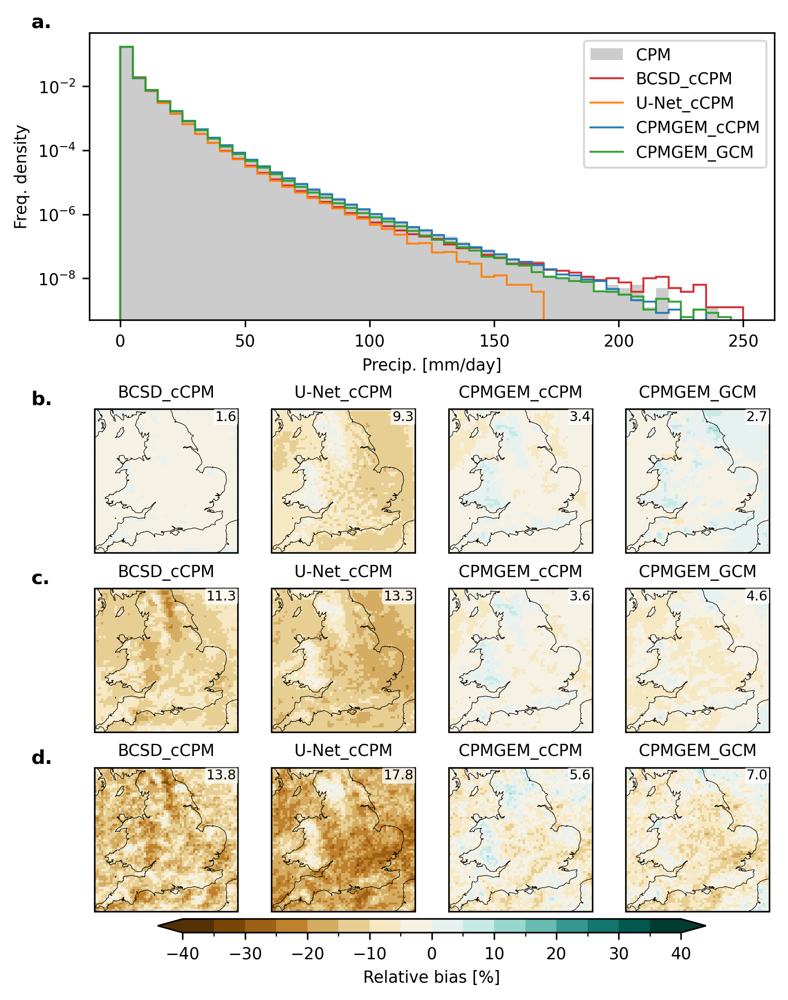

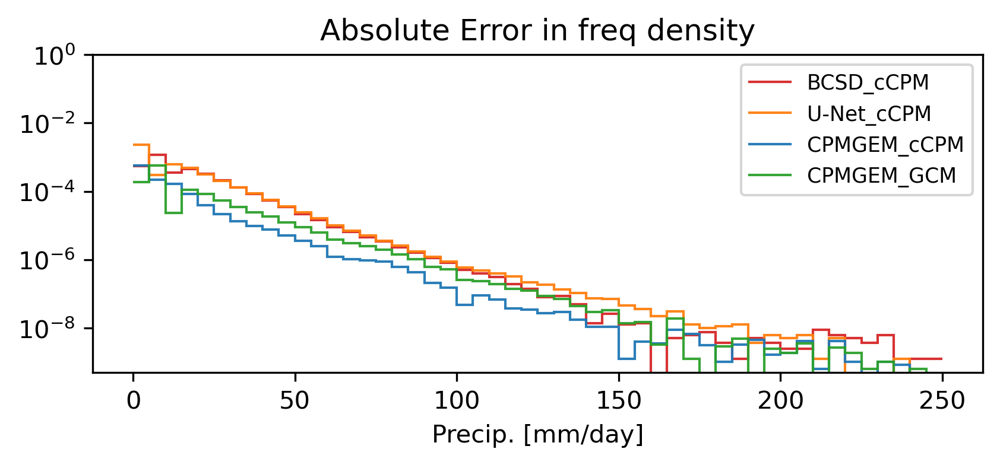

6.2793370627572015e-09
5e-10


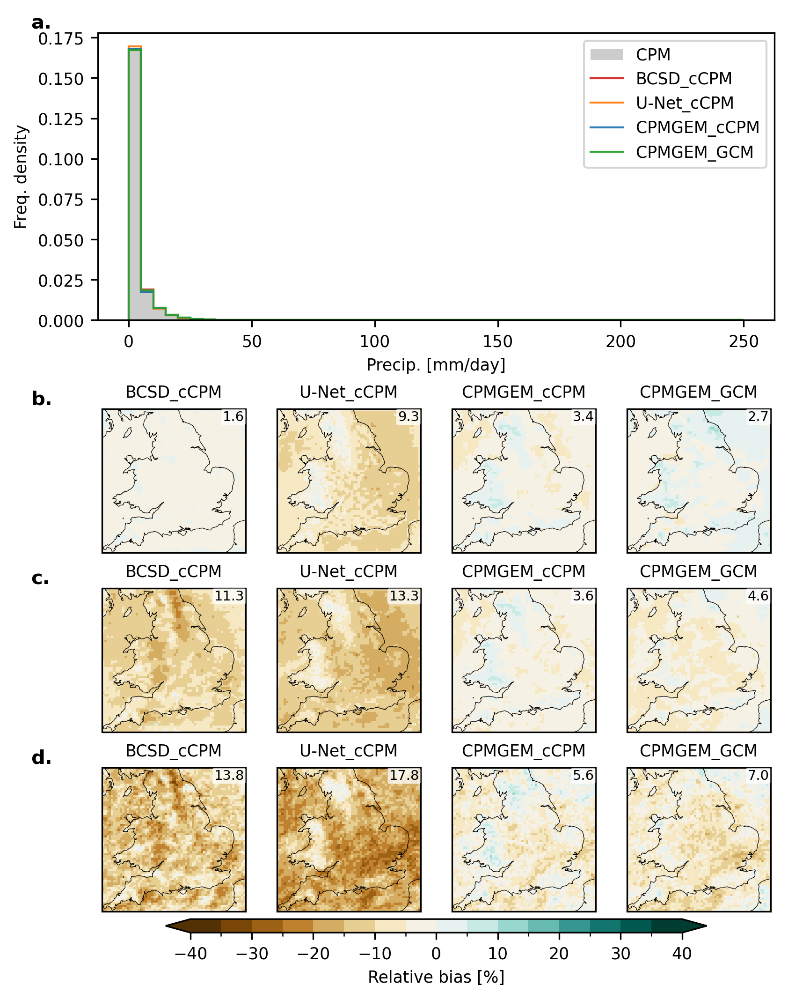

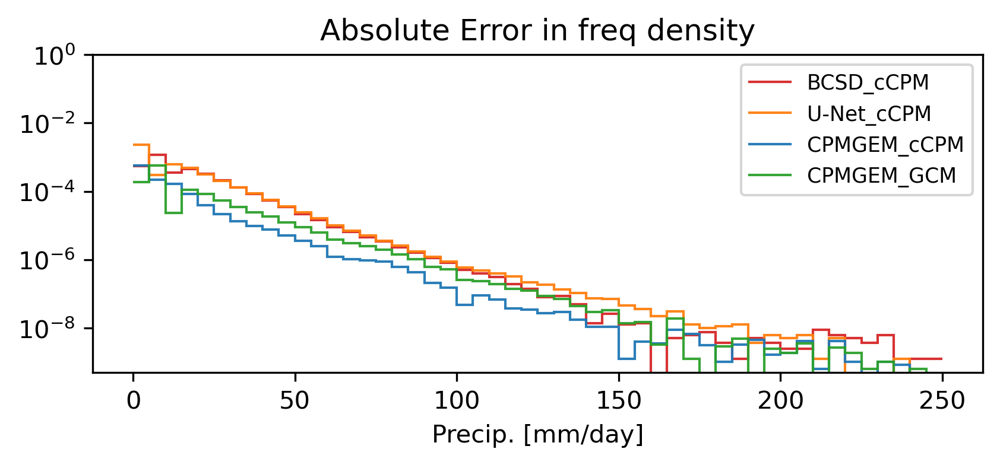

In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"### {var}", raw=True)
    
    hist_das = PRED_DAS[var]
    cpm_da = CPM_DAS[var]
    
    metrics_ds = compute_metrics(hist_das, cpm_da, thresholds=DIST_THRESHOLDS[var])

    pretty_table(metrics_ds, round=4)
    
    normalize=(var == "pr")
    mean_biases = PRED_DAS[var].groupby("model").map(mean_bias, cpm_da=VAR_DAS[var][f"target_{var}"], normalize=(var=="pr"))

    std_biases = PRED_DAS[var].groupby("model").map(std_bias, cpm_da=VAR_DAS[var][f"target_{var}"], normalize=(var=="pr"))
    f_q999_bias = functools.partial(stat_bias, stat_func=functools.partial(xr.DataArray.quantile, q=0.999))
    q999_biases = PRED_DAS[var].groupby("model").map(f_q999_bias, cpm_da=VAR_DAS[var][f"target_{var}"], normalize=(var=="pr"))
    
    bias_kwargs = {"style": f"{var}Bias"}
    for fd_kwargs in [{"yscale": "log"}, {"yscale": "linear"}]:
        fig = plt.figure(layout="constrained", figsize=(5.5, 7))
        error_fig = plt.figure(layout="constrained", figsize=(5.5, 2.5))
        error_axd = error_fig.subplot_mosaic([["Error"]])
        error_ax = error_axd["Error"]
        axd = plot_distribution_figure(
            fig,
            hist_das,
            cpm_da,
            mean_biases,
            std_biases,
            q999_biases,
            MODELLABEL2SPEC,
            error_ax=error_ax, hrange=VAR_RANGES[var], fd_kwargs=fd_kwargs, bias_kwargs=bias_kwargs
        )
        if var == "relhum150cm":
            axd["Density"].axvline(x=100, color='k', linestyle='--', linewidth=1)
        
        plt.show()

## QQ plots

### pr

-8


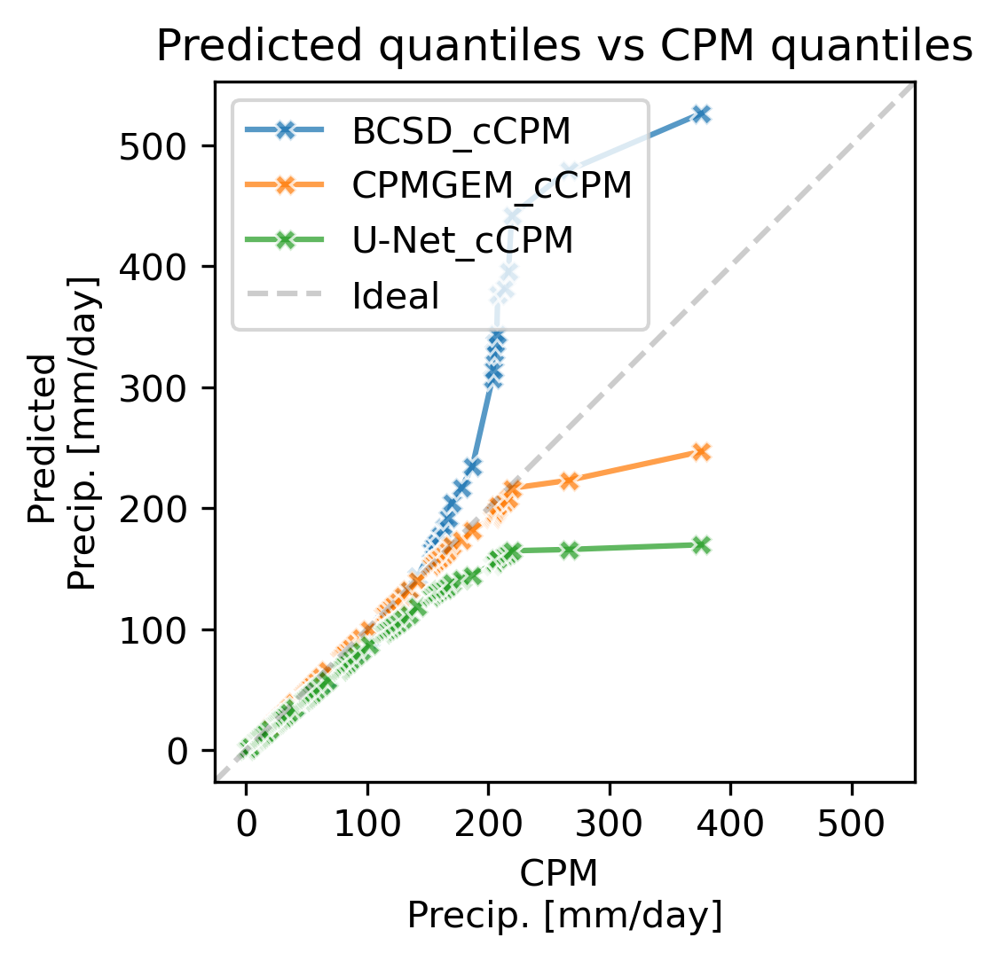

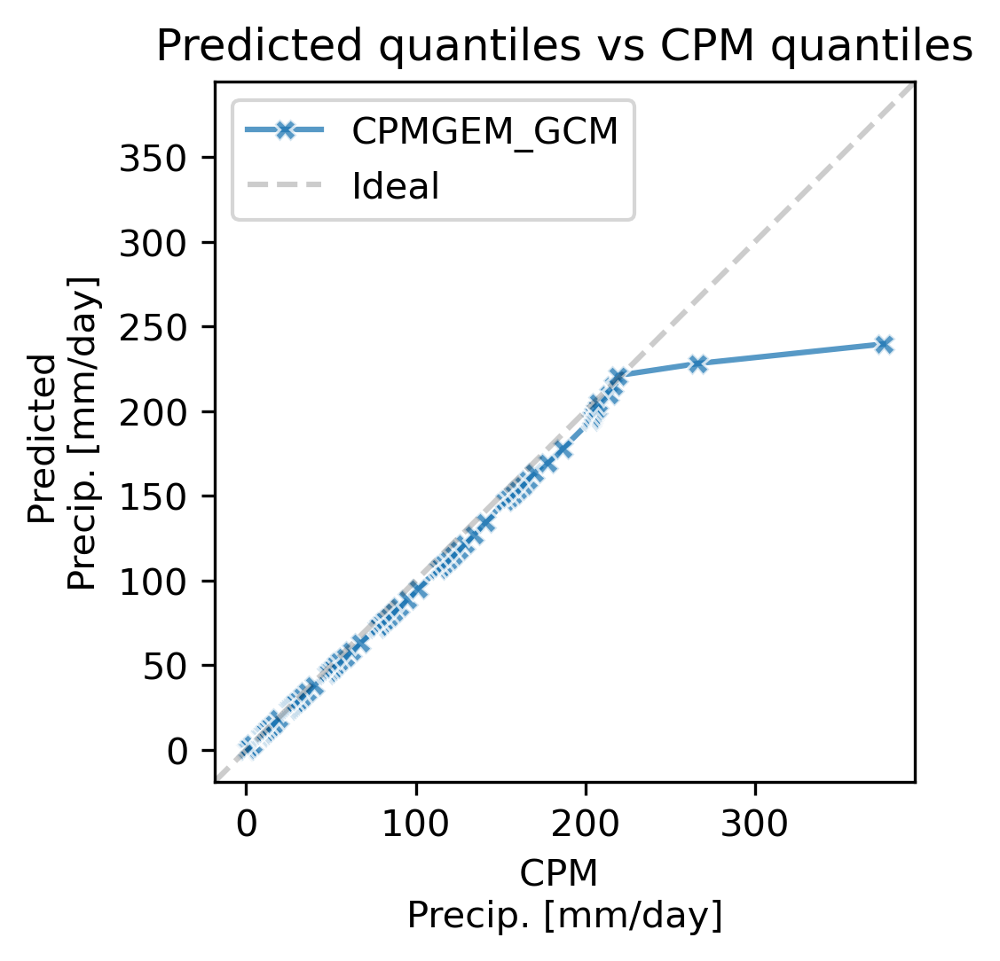

In [ ]:
quantile_dims=["ensemble_member", "time", "grid_latitude", "grid_longitude"]

for var in eval_vars:
    IPython.display.display_markdown(f"### {var}", raw=True)

    quantiles = reasonable_quantiles(CPM_DAS[var])
    cpm_quantiles = CPM_DAS[var].quantile(quantiles, dim=quantile_dims).rename("target_q")

    for source, ds in EVAL_DS.items():
        pred_da = ds[f"pred_{var}"]
        pred_quantiles = pred_da.quantile(quantiles, dim=quantile_dims).rename("pred_q")

        layout="constrained"

        fig, ax = plt.subplots(figsize=(3.5, 3.5), layout="constrained")

        xlabel = f"CPM \n{xr.plot.utils.label_from_attrs(da=CPM_DAS[var])}"
        ylabel = f"Predicted \n{xr.plot.utils.label_from_attrs(da=pred_da)}"

        qq_plot(ax, cpm_quantiles, pred_quantiles, title=f"Predicted quantiles vs CPM quantiles", xlabel=xlabel, ylabel=ylabel)

    plt.show()

## Figure: subdomain

### pr

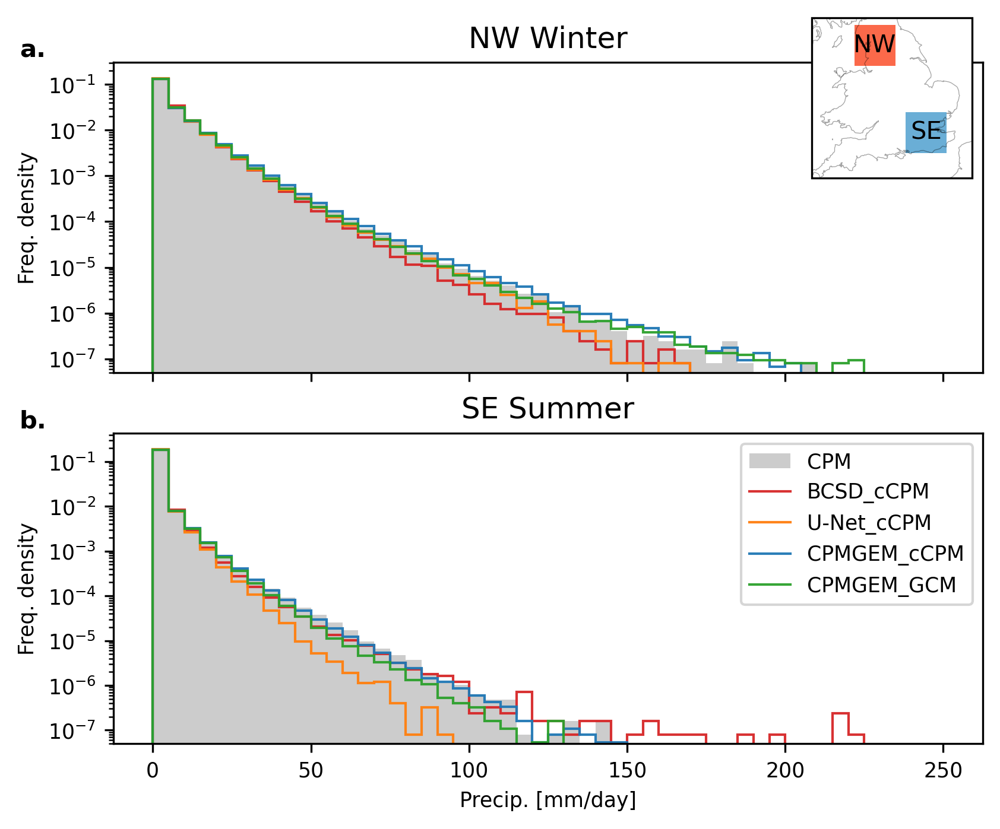

In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"### {var}", raw=True)

    fd_fig = plt.figure(figsize=(5.5, 4.5), layout="constrained")

    human_names = {
        "DJF": "Winter",
        "JJA": "Summer",
    }

    axd = fd_fig.subplot_mosaic([["NW"], ["SE"]], sharex=True)
    
    for i, (srname, season) in enumerate([("NW", "DJF"), ("SE", "JJA")]):

        season_mask = CPM_DAS[var]["time"]["time.season"] == season

        srseason_cpm_da = CPM_DAS[var].isel(**SUBREGIONS[srname]).sel(time=season_mask)

        srseason_hist_data = [
            dict(data=EVAL_DS[source][f"pred_{var}"].sel(model=model).isel(**SUBREGIONS[srname]).sel(time=season_mask), label=model, color=spec["color"]) for source, mconfigs in MODELS.items() for model, spec in mconfigs.items()
        ]

        ax = axd[srname]
        if var == "pr":
            kwargs = {
                "yscale": "log",
            }
        else:
            kwargs = {
                "yscale": "linear",
            }
        plot_freq_density(srseason_hist_data, ax=ax, target_da=srseason_cpm_da, linewidth=1, hrange=VAR_RANGES[var], **kwargs)
        ax.set_title(f"{srname} {human_names[season]}")

        if i == 0:
            ax.set_xlabel("")
            ax.get_legend().remove()
            reg_ax = fd_fig.add_axes([0.8, 0.8, 0.2, 0.2], projection=cp_model_rotated_pole)
            # reg_ax = fd_fig.subplots(1, subplot_kw = dict(projection=cp_model_rotated_pole))
            nw_cpm_da = CPM_DAS[var].isel(**SUBREGIONS["NW"])
            se_cpm_da = CPM_DAS[var].isel(**SUBREGIONS["SE"])
            plot_map(10*xr.ones_like(nw_cpm_da.isel(ensemble_member=0, time=0)), ax=reg_ax, style=None, cmap="Reds", cl_kwargs=dict(alpha=0.2))
            plot_map(1*xr.ones_like(se_cpm_da.isel(ensemble_member=0, time=0)), ax=reg_ax, style=None, cmap="Blues", cl_kwargs=dict(alpha=0.2))
            reg_ax.annotate("NW", xy=(nw_cpm_da.grid_longitude.mean().values.item(), nw_cpm_da.grid_latitude.mean().values.item()), xycoords="data", fontsize="medium", ha="center", va="center")
            reg_ax.annotate("SE", xy=(se_cpm_da.grid_longitude.mean().values.item(), se_cpm_da.grid_latitude.mean().values.item()), xycoords="data", fontsize="medium", ha="center", va="center")
            reg_ax.set_extent([-2, 3, -2.5, 2.5], crs=cp_model_rotated_pole)


        ax.annotate(f"{string.ascii_lowercase[i]}.", xy=(0.02, 1.0), xycoords=("figure fraction", "axes fraction"), weight='bold', ha="left", va="bottom")

    plt.show()

## Individual box locations

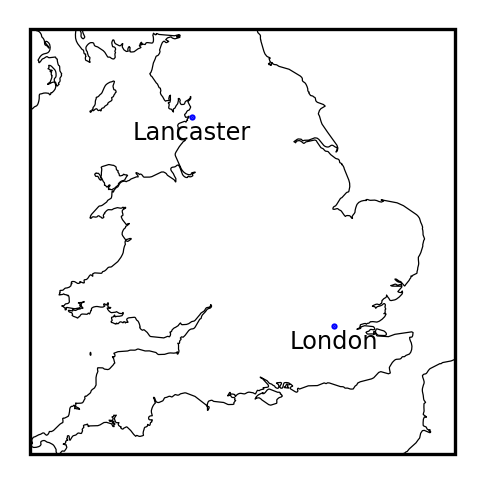

In [ ]:
fig = plt.figure(layout="constrained", figsize=(1.5, 1.5))
ax = fig.subplots(subplot_kw={"projection": cp_model_rotated_pole})
ax.coastlines(**{"resolution": "10m", "linewidth": 0.3})
da = CPM_DAS[eval_vars[0]]
ax.set_extent((
    da.cf["X"].min(),
    da.cf["X"].max(),
    da.cf["Y"].min(),
    da.cf["Y"].max(),
))

for label, q in BOX_LOCATIONS.items():
    single_box_da = da.cf.sel(**q, method="nearest")
    ax.plot(single_box_da.cf["X"].values, single_box_da.cf["Y"].values, color='blue', markersize=0.5, marker='o', transform=cp_model_rotated_pole)
    ax.annotate(
        xy=(single_box_da.cf["X"].item(), single_box_da.cf["Y"].item()), xycoords="data",
        text=label, xytext=(0, -15), textcoords="offset pixels",
        ha='center',va="center", transform=cp_model_rotated_pole, fontsize="xx-small")
    
plt.show()

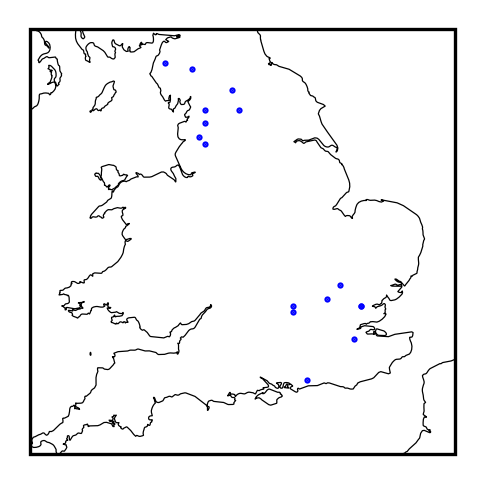

In [ ]:
da = CPM_DAS[eval_vars[0]]

rng = np.random.default_rng(42)

RANDOM_BOX_LOCATIONS = {
    srname: {
        i: { c: rng.choice(da.isel(**SUBREGIONS[srname]).cf[c], 1)[0] for c in ["X", "Y"] }
        for i in range(8) }
    for srname in SUBREGIONS.keys()
}

fig = plt.figure(layout="constrained", figsize=(1.5, 1.5))
ax = fig.subplots(subplot_kw={"projection": cp_model_rotated_pole})
ax.coastlines(**{"resolution": "10m", "linewidth": 0.3})

ax.set_extent((
    da.cf["X"].min(),
    da.cf["X"].max(),
    da.cf["Y"].min(),
    da.cf["Y"].max(),
))

for srname, sr_random_box_locations in RANDOM_BOX_LOCATIONS.items():
    for q in sr_random_box_locations.values():
        single_box_da = da.cf.sel(**q, method="nearest")
        ax.plot(single_box_da.cf["X"].values, single_box_da.cf["Y"].values, color='blue', markersize=0.5, marker='o', transform=cp_model_rotated_pole)
        
plt.show()

### Figure: single box distribution

* Frequency Density Histogram of rainfall intensities

Table of:

* RMS biases
* J-S Distances
* proportion of density over thresholds

#### pr

NaN Count 
 RMS Mean Bias (mm/day) 
 RMS Std Dev Bias (mm/day) 
 RMS Q999 Bias (mm/day) 
 Relative RMS Mean Bias (%) 
 Relative RMS Std Dev Bias (%) 
 Relative RMS Q999 Bias (%) 
 J-S distance 
 Emu > 0.1 
 Emu > 0.1 - CPM > 0.1 
 Emu > 25 
 Emu > 25 - CPM > 25 
 Emu > 75 
 Emu > 75 - CPM > 75 
 Emu > 125 
 Emu > 125 - CPM > 125 
 grid_latitude 
 grid_longitude 
 quantile 
 
 
 location 
 model 
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
 
 
 
 
 London 
 BCSD_cCPM 
 0 
 0.02066 
 0.3719 
 2.548 
 1.118 
 8.69 
 6.409 
 0.03281 
 0.5451 
 0.1064 
 0.003755 
 -0.001209 
 5.144e-05 
 2.572e-05 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 CPMGEM_GCM 
 0 
 0.06133 
 0.2602 
 3.719 
 3.32 
 6.078 
 9.353 
 0.01771 
 0.4517 
 0.01305 
 0.00436 
 -0.0006044 
 2.143e-05 
 -4.287e-06 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 CPMGEM_cCPM 
 0 
 0.07953 
 0.1372 
 0.9594 
 4.305 
 3.205 
 2.413 
 0.01686 
 0.4311 
 -0.007519 
 0.004733 
 -0.0002315 
 2.143e-05 
 -4.287e-06 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 U-Net_cCPM 
 0 
 0.1964 
 0.6702 
 8.951 
 10.63 
 15.66 
 22.51 
 0.02933 
 0.4753 
 0.03665 
 0.002495 
 -0.002469 
 0 
 -2.572e-05 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 Lancaster 
 BCSD_cCPM 
 0 
 0.02388 
 0.6358 
 4.493 
 0.6444 
 9.869 
 9.026 
 0.04724 
 0.7494 
 0.1514 
 0.01247 
 -0.004861 
 7.716e-05 
 -2.572e-05 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 CPMGEM_GCM 
 0 
 0.09066 
 0.3366 
 2.22 
 2.446 
 5.224 
 4.46 
 0.01941 
 0.6178 
 0.01986 
 0.01421 
 -0.003121 
 8.573e-05 
 -1.715e-05 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 CPMGEM_cCPM 
 0 
 0.03745 
 0.06921 
 0.04985 
 1.011 
 1.074 
 0.1002 
 0.01321 
 0.5979 
 -0.0001115 
 0.01659 
 -0.0007459 
 8.573e-05 
 -1.715e-05 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 U-Net_cCPM 
 0 
 0.116 
 0.4837 
 4.301 
 3.13 
 7.508 
 8.642 
 0.02586 
 0.6427 
 0.0447 
 0.01368 
 -0.003652 
 5.144e-05 
 -5.144e-05 
 0 
 0 
 1.51 
 359.8 
 0.999

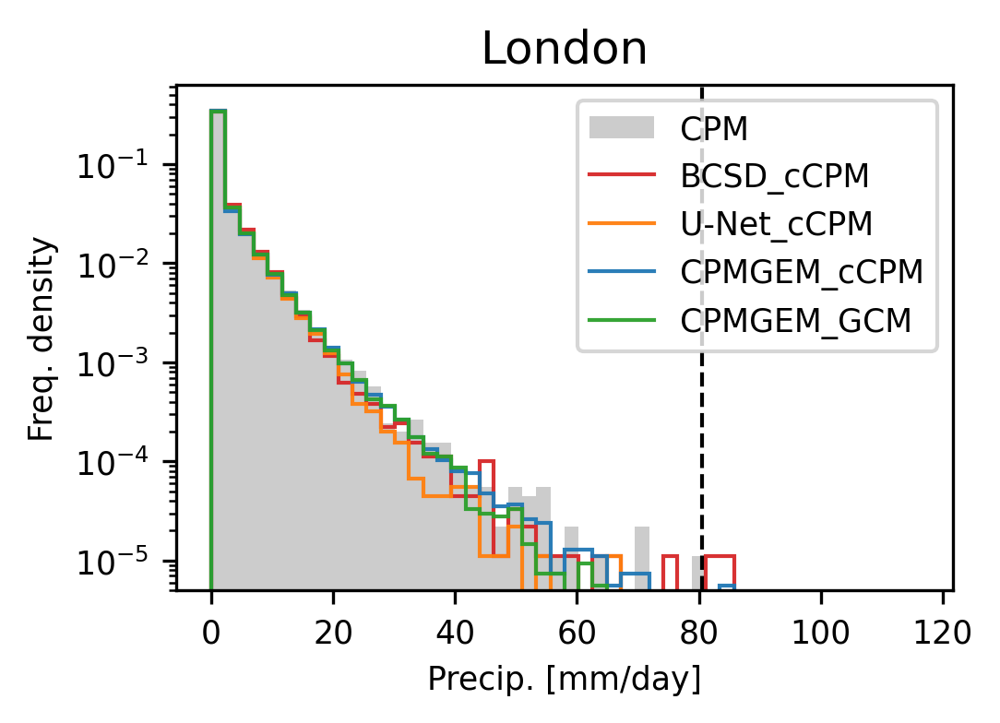

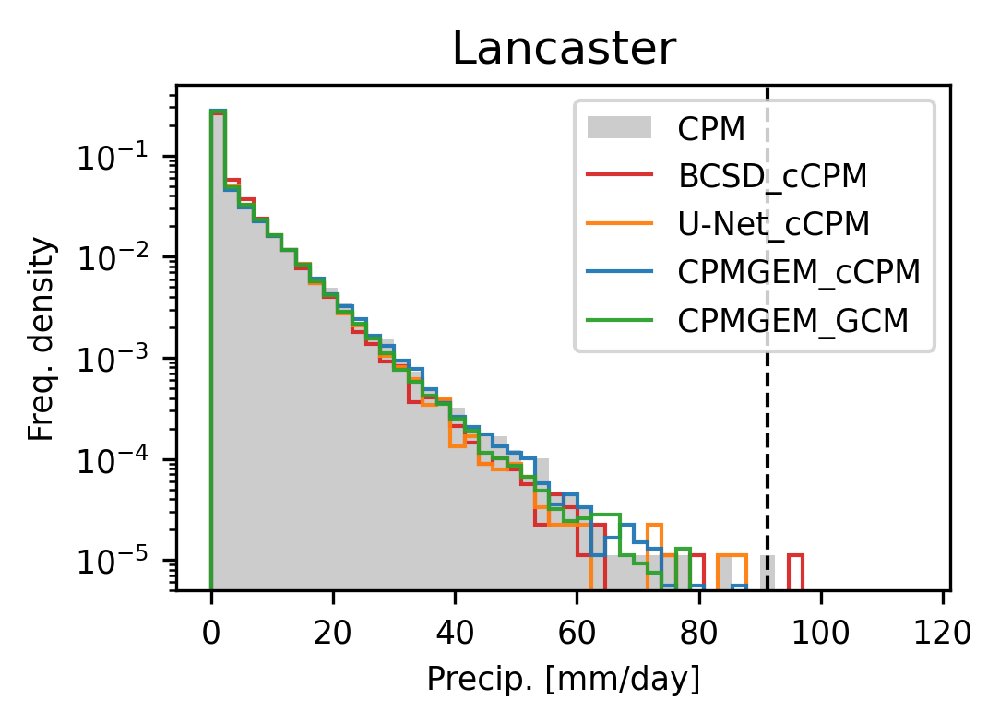

In [ ]:
def _metrics(label, q, var_ds, thresholds):
    ds = var_ds.cf.sel(**q, method="nearest")
    cpm_da = ds[f"target_{var}"]
    pred_da = ds[f"pred_{var}"]
    
    return compute_metrics(pred_da, cpm_da, thresholds=thresholds).expand_dims({"location": [label]})
    
for var in eval_vars:
    IPython.display.display_markdown(f"#### {var}", raw=True)
        
    metrics_ds = xr.concat(
        [ _metrics(label, q, VAR_DAS[var], DIST_THRESHOLDS[var]) for label, q in BOX_LOCATIONS.items() ], 
        dim="location"
    )

    pretty_table(metrics_ds, round=4)
    
    for label, q in BOX_LOCATIONS.items():
        ds = VAR_DAS[var].cf.sel(**q, method="nearest")
        pred_da = ds[f"pred_{var}"]
        cpm_da = ds[f"target_{var}"]
        
        fig = plt.figure(layout="constrained", figsize=(3.5, 2.5))
        
        ax = plot_freq_density_figure(pred_da, cpm_da, MODELLABEL2SPEC, fig)
        
        ax.axvline(x=cpm_da.max(), color='k', linestyle='--', linewidth=1)
        ax.set_title(label)
        
        plt.show()

### London vs SE (inc SE domain max) distribution

#### pr

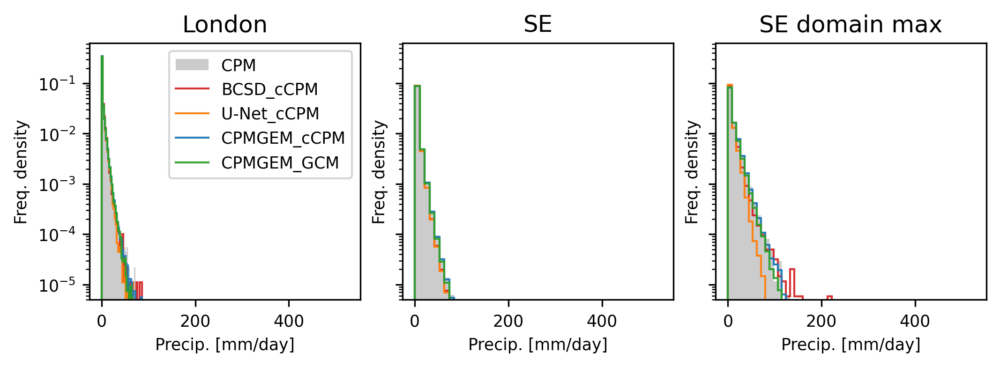

In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"#### {var}", raw=True)

    fig = plt.figure(layout="constrained", figsize=(7, 2.5))

    axd = fig.subplot_mosaic([["London", "SE", "SE max"]], sharex=True, sharey=True)

    
    label="London"
    q = BOX_LOCATIONS[label]
    
    ds = VAR_DAS[var].cf.sel(**q, method="nearest")
    
    pred_da = ds[f"pred_{var}"]
    cpm_da = ds[f"target_{var}"]
    
    hist_data = sorted(
        map(
            lambda modelgp: dict(
                data=modelgp[1].squeeze("model"),
                label=modelgp[0],
                color=MODELLABEL2SPEC[modelgp[0]]["color"],
            ),
            pred_da.groupby("model", squeeze=False),
        ),
        key=lambda x: MODELLABEL2SPEC[x["label"]]["order"],
    )

    ax = axd[label]
    plot_freq_density(hist_data, ax=ax, target_da=cpm_da, linewidth=1, yscale="log")
    
    # ax.axvline(x=cpm_da.max(), color='k', linestyle='--', linewidth=1)
    ax.set_title(label)

    label="SE"
    q = SUBREGIONS[label]
    
    ds = VAR_DAS[var]
    
    pred_da = ds[f"pred_{var}"]
    cpm_da = ds[f"target_{var}"]
    
    hist_data = sorted(
        map(
            lambda modelgp: dict(
                data=modelgp[1].squeeze("model"),
                label=modelgp[0],
                color=MODELLABEL2SPEC[modelgp[0]]["color"],
            ),
            pred_da.groupby("model", squeeze=False),
        ),
        key=lambda x: MODELLABEL2SPEC[x["label"]]["order"],
    )

    ax = axd[label]
    plot_freq_density(hist_data, ax=ax, target_da=cpm_da, linewidth=1, yscale="log", legend=False)
    
    # ax.axvline(x=cpm_da.max(), color='k', linestyle='--', linewidth=1)
    ax.set_title(label)
    
    label="SE"
    q = SUBREGIONS[label]
    
    ds = VAR_DAS[var].isel(**q).max(["grid_longitude", "grid_latitude"], keep_attrs=True)
    
    pred_da = ds[f"pred_{var}"]
    cpm_da = ds[f"target_{var}"]
    
    hist_data = sorted(
        map(
            lambda modelgp: dict(
                data=modelgp[1].squeeze("model"),
                label=modelgp[0],
                color=MODELLABEL2SPEC[modelgp[0]]["color"],
            ),
            pred_da.groupby("model", squeeze=False),
        ),
        key=lambda x: MODELLABEL2SPEC[x["label"]]["order"],
    )

    ax = axd[f"{label} max"]
    plot_freq_density(hist_data, ax=ax, target_da=cpm_da, linewidth=1, yscale="log", legend=False)
    
    # ax.axvline(x=cpm_da.max(), color='k', linestyle='--', linewidth=1)
    ax.set_title(f"{label} domain max")
        
    plt.show()

### pr

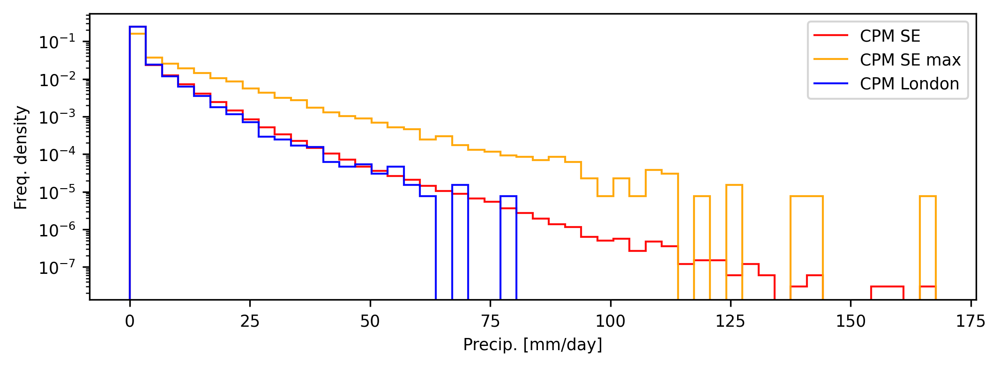

In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"### {var}", raw=True)

    fig = plt.figure(layout="constrained", figsize=(7, 2.5))

    ax = fig.subplots()
    
    hist_data = [
        dict(
            data=VAR_DAS[var][f"target_{var}"].isel(**SUBREGIONS["SE"]),
            label="CPM SE",
            color="red",
        ),
        dict(
            data=VAR_DAS[var][f"target_{var}"].isel(**SUBREGIONS["SE"]).max(["grid_longitude", "grid_latitude"]),
            label="CPM SE max",
            color="orange",
        ),
        dict(
            data=VAR_DAS[var][f"target_{var}"].cf.sel(**BOX_LOCATIONS["London"], method="nearest"),
            label="CPM London",
            color="blue",
        ),
    ]

    plot_freq_density(hist_data, ax=ax, linewidth=1, yscale="log")
       
    plt.show()

### pr

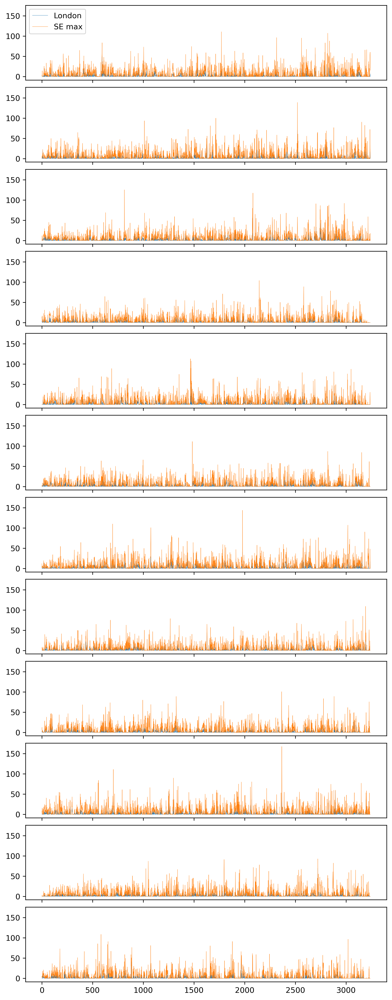

In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"### {var}", raw=True)

    fig = plt.figure(layout="constrained", figsize=(7, 1.5*len(ensemble_members)))

    axd = fig.subplot_mosaic(np.array(ensemble_members).reshape(-1,1), sharex=True, sharey=True)

    for i, em in enumerate(ensemble_members):
        da = VAR_DAS[var][f"target_{var}"].sel(ensemble_member=em)
        ax = axd[em]
        ax.plot(range(len(da["time"])), da.cf.sel(**BOX_LOCATIONS["London"], method="nearest"), linewidth=0.3, label="London")
        ax.plot(range(len(da["time"])), da.isel(**SUBREGIONS["SE"]).max(["grid_longitude", "grid_latitude"], keep_attrs=True), linewidth=0.3, label="SE max")
        if i == 0:
            ax.legend()


    plt.show()

### Lancaster vs NW (inc NW domain max) distribution

### pr

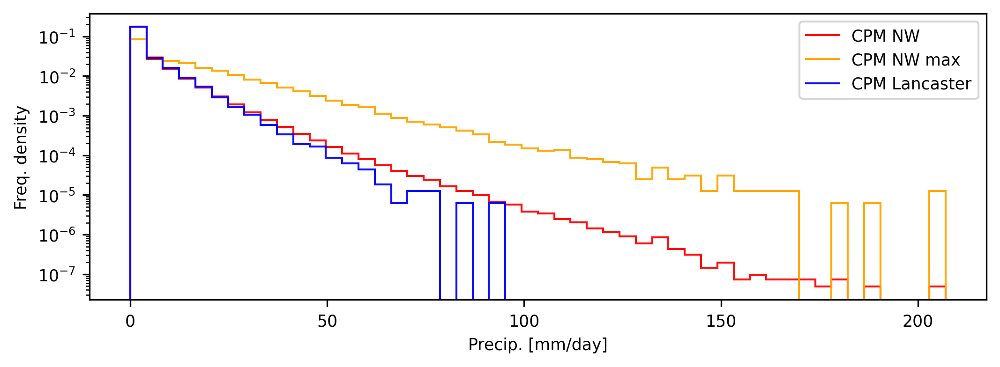

In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"### {var}", raw=True)

    fig = plt.figure(layout="constrained", figsize=(7, 2.5))

    ax = fig.subplots()
    
    hist_data = [
        dict(
            data=VAR_DAS[var][f"target_{var}"].isel(**SUBREGIONS["NW"]),
            label="CPM NW",
            color="red",
        ),
        dict(
            data=VAR_DAS[var][f"target_{var}"].isel(**SUBREGIONS["NW"]).max(["grid_longitude", "grid_latitude"]),
            label="CPM NW max",
            color="orange",
        ),
        dict(
            data=VAR_DAS[var][f"target_{var}"].cf.sel(**BOX_LOCATIONS["Lancaster"], method="nearest"),
            label="CPM Lancaster",
            color="blue",
        ),
    ]

    plot_freq_density(hist_data, ax=ax, linewidth=1, yscale="log")
       
    plt.show()

### pr

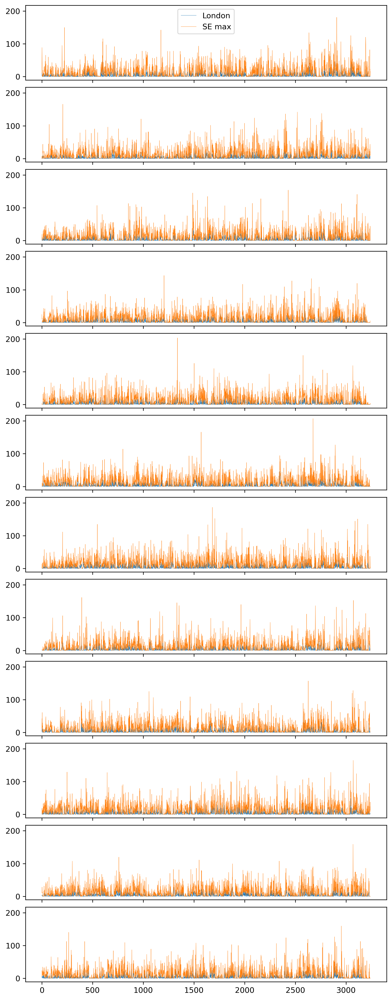

In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"### {var}", raw=True)

    fig = plt.figure(layout="constrained", figsize=(7, 1.5*len(ensemble_members)))

    axd = fig.subplot_mosaic(np.array(ensemble_members).reshape(-1,1), sharex=True, sharey=True)

    for i, em in enumerate(ensemble_members):
        da = VAR_DAS[var][f"target_{var}"].sel(ensemble_member=em)
        ax = axd[em]
        ax.plot(range(len(da["time"])), da.cf.sel(**BOX_LOCATIONS["Lancaster"], method="nearest"), linewidth=0.3, label="London")
        ax.plot(range(len(da["time"])), da.isel(**SUBREGIONS["NW"]).max(["grid_longitude", "grid_latitude"], keep_attrs=True), linewidth=0.3, label="SE max")
        if i == 0:
            ax.legend()


    plt.show()

### Figure: per time period single box distribution

* Frequency Density Histogram of rainfall intensities

Table of:

* RMS biases
* J-S Distances
* proportion of density over thresholds

#### pr

NaN Count 
 RMS Mean Bias (mm/day) 
 RMS Std Dev Bias (mm/day) 
 RMS Q999 Bias (mm/day) 
 Relative RMS Mean Bias (%) 
 Relative RMS Std Dev Bias (%) 
 Relative RMS Q999 Bias (%) 
 J-S distance 
 Emu > 0.1 
 Emu > 0.1 - CPM > 0.1 
 Emu > 25 
 Emu > 25 - CPM > 25 
 Emu > 75 
 Emu > 75 - CPM > 75 
 Emu > 125 
 Emu > 125 - CPM > 125 
 grid_latitude 
 grid_longitude 
 quantile 
 
 
 time_period 
 location 
 model 
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
 
 
 
 
 future 
 London 
 BCSD_cCPM 
 0 
 1.548e-05 
 0.2395 
 1.01 
 0.0008446 
 5.326 
 2.471 
 0.03505 
 0.5006 
 0.09599 
 0.006173 
 -0.000463 
 7.716e-05 
 7.716e-05 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 CPMGEM_GCM 
 0 
 0.1153 
 0.3582 
 1.735 
 6.294 
 7.965 
 4.244 
 0.02623 
 0.4105 
 0.005916 
 0.005118 
 -0.001517 
 3.858e-05 
 3.858e-05 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 CPMGEM_cCPM 
 0 
 0.08766 
 0.2039 
 0.2038 
 4.783 
 4.534 
 0.4984 
 0.02501 
 0.3953 
 -0.009311 
 0.005466 
 -0.00117 
 5.144e-05 
 5.144e-05 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 U-Net_cCPM 
 0 
 0.1902 
 0.8949 
 10.49 
 10.38 
 19.9 
 25.65 
 0.04625 
 0.4775 
 0.07284 
 0.002238 
 -0.004398 
 0 
 0 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 Lancaster 
 BCSD_cCPM 
 0 
 0.02137 
 0.5977 
 4.469 
 0.5487 
 8.614 
 8.494 
 0.0514 
 0.7357 
 0.1542 
 0.0169 
 -0.005015 
 0.0001543 
 0 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 CPMGEM_GCM 
 0 
 0.07789 
 0.3444 
 0.4228 
 2 
 4.963 
 0.8036 
 0.02538 
 0.6027 
 0.02118 
 0.01824 
 -0.003678 
 0.0001029 
 -5.144e-05 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 CPMGEM_cCPM 
 0 
 0.05757 
 0.1642 
 0.06657 
 1.478 
 2.366 
 0.1265 
 0.02278 
 0.5817 
 0.00018 
 0.02058 
 -0.001337 
 0.0001286 
 -2.572e-05 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 U-Net_cCPM 
 0 
 0.2252 
 0.8914 
 8.494 
 5.784 
 12.85 
 16.15 
 0.04381 
 0.6479 
 0.06644 
 0.01528 
 -0.006636 
 0 
 -0.0001543 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 historic 
 London 
 BCSD_cCPM 
 0 
 0.029 
 0.4289 
 5.191 
 1.546 
 10.59 
 13.73 
 0.03888 
 0.5886 
 0.114 
 0.002083 
 -0.001235 
 7.716e-05 
 0 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 CPMGEM_GCM 
 0 
 0.003919 
 0.1376 
 4.59 
 0.2089 
 3.398 
 12.14 
 0.02266 
 0.4953 
 0.02076 
 0.003588 
 0.0002701 
 0 
 -7.716e-05 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 CPMGEM_cCPM 
 0 
 0.05827 
 0.05953 
 1.692 
 3.106 
 1.47 
 4.477 
 0.02553 
 0.4699 
 -0.004604 
 0.003909 
 0.0005916 
 0 
 -7.716e-05 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 U-Net_cCPM 
 0 
 0.1896 
 0.4686 
 7.677 
 10.1 
 11.57 
 20.31 
 0.02988 
 0.4816 
 0.007022 
 0.002315 
 -0.001003 
 0 
 -7.716e-05 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 Lancaster 
 BCSD_cCPM 
 0 
 0.04506 
 0.6969 
 4.553 
 1.295 
 11.89 
 10.55 
 0.06467 
 0.759 
 0.1524 
 0.007948 
 -0.005015 
 0 
 0 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 CPMGEM_GCM 
 0 
 0.01816 
 0.1539 
 0.6456 
 0.5219 
 2.627 
 1.497 
 0.02737 
 0.6314 
 0.02483 
 0.01143 
 -0.00153 
 7.716e-05 
 7.716e-05 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 CPMGEM_cCPM 
 0 
 0.006615 
 0.05064 
 2.866 
 0.1901 
 0.8641 
 6.643 
 0.02464 
 0.6095 
 0.002971 
 0.01254 
 -0.0004244 
 5.144e-05 
 5.144e-05 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 U-Net_cCPM 
 0 
 0.03335 
 0.01118 
 3.612 
 0.9581 
 0.1907 
 8.372 
 0.03067 
 0.6373 
 0.03071 
 0.01181 
 -0.001157 
 7.716e-05 
 7.716e-05 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 present 
 London 
 BCSD_cCPM 
 0 
 0.03296 
 0.4628 
 1.642 
 1.797 
 10.81 
 4.286 
 0.04369 
 0.5461 
 0.1093 
 0.003009 
 -0.001929 
 0 
 0 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 CPMGEM_GCM 
 0 
 0.07257 
 0.2778 
 2.698 
 3.957 
 6.489 
 7.04 
 0.02714 
 0.4493 
 0.01249 
 0.004372 
 -0.0005658 
 2.572e-05 
 2.572e-05 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 CPMGEM_cCPM 
 0 
 0.09267 
 0.1422 
 0.4656 
 5.053 
 3.322 
 1.215 
 0.02102 
 0.4282 
 -0.008642 
 0.004823 
 -0.0001157 
 1.286e-05 
 1.286e-05 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 U-Net_cCPM 
 0 
 0.2094 
 0.636 
 6.062 
 11.42 
 14.85 
 15.82 
 0.037

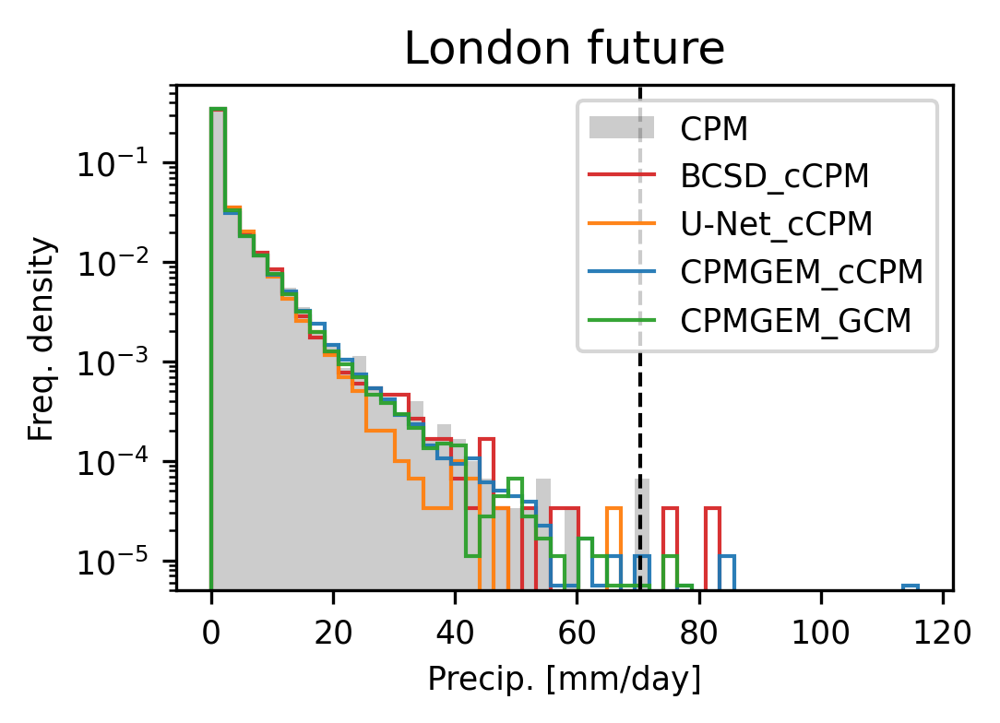

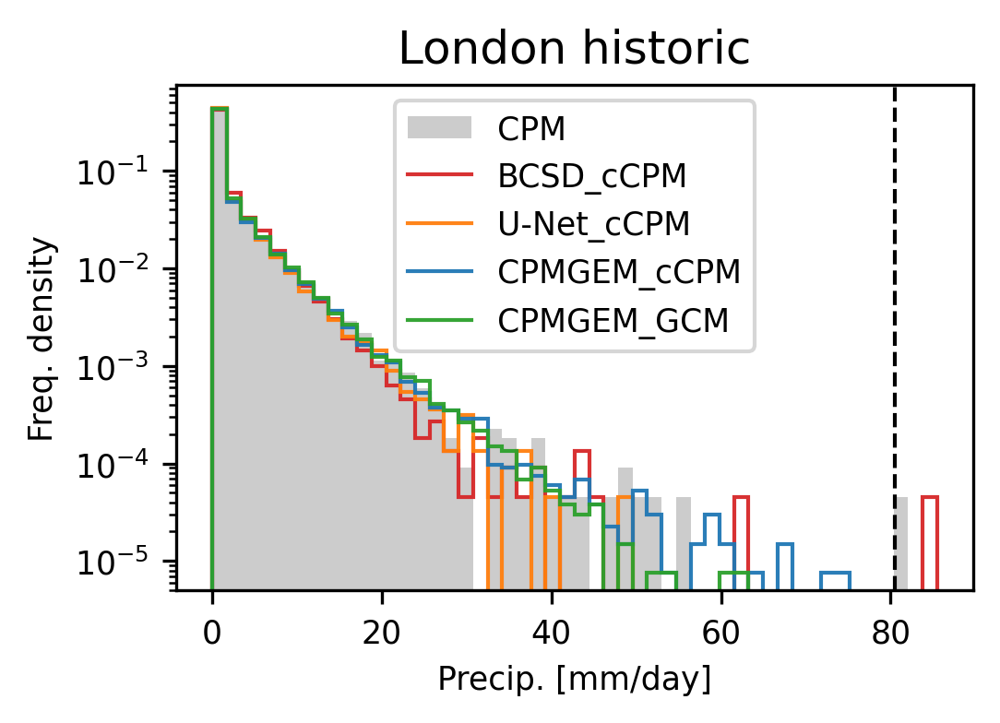

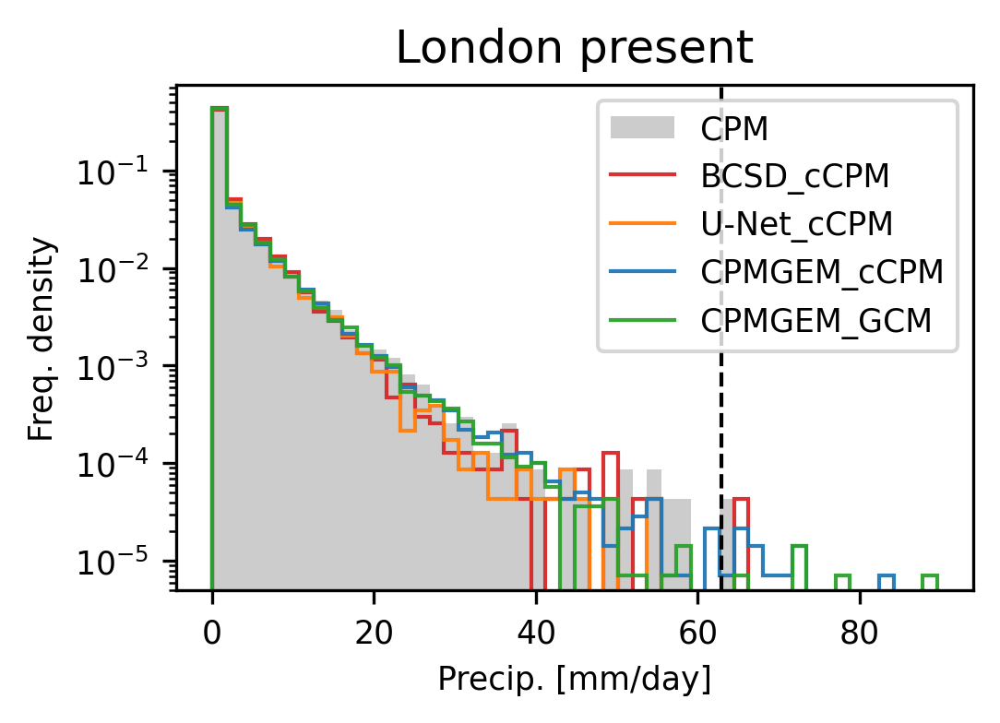

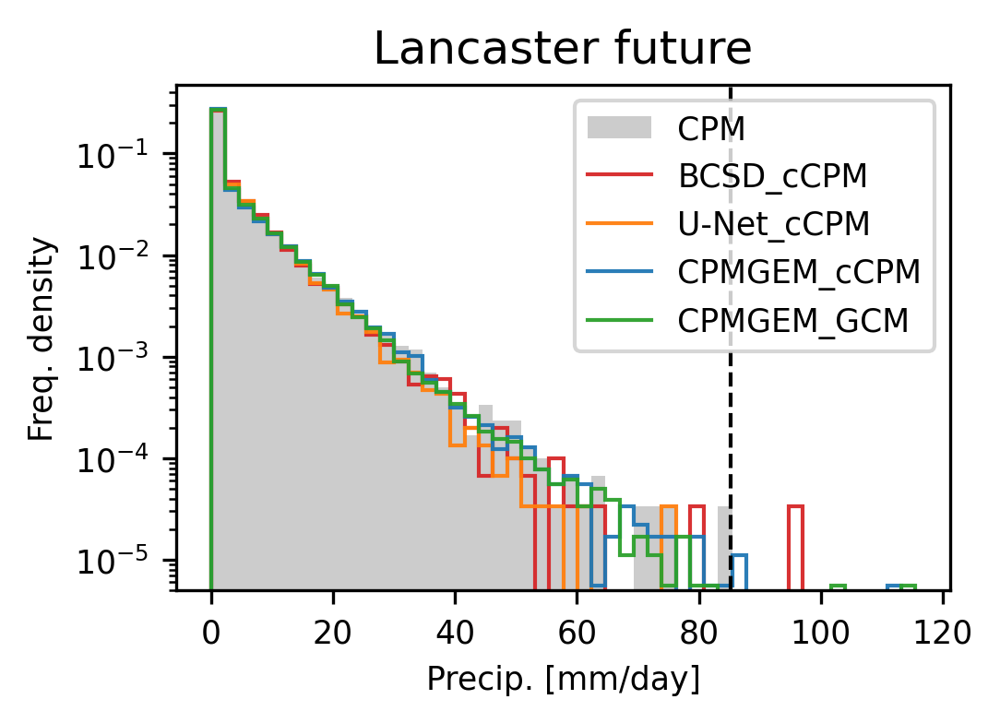

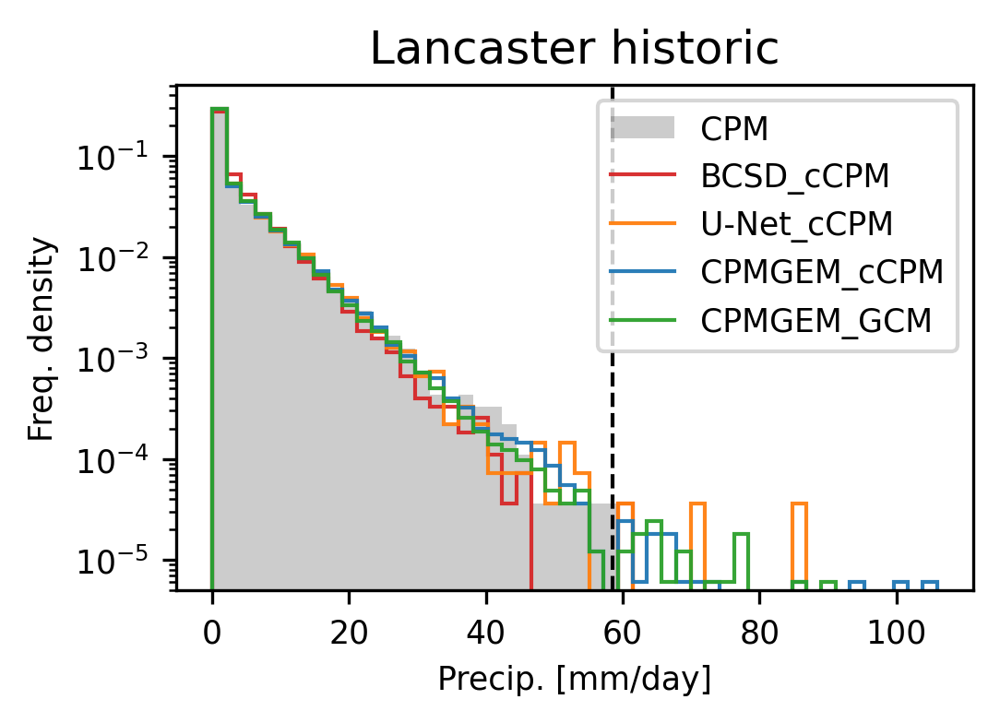

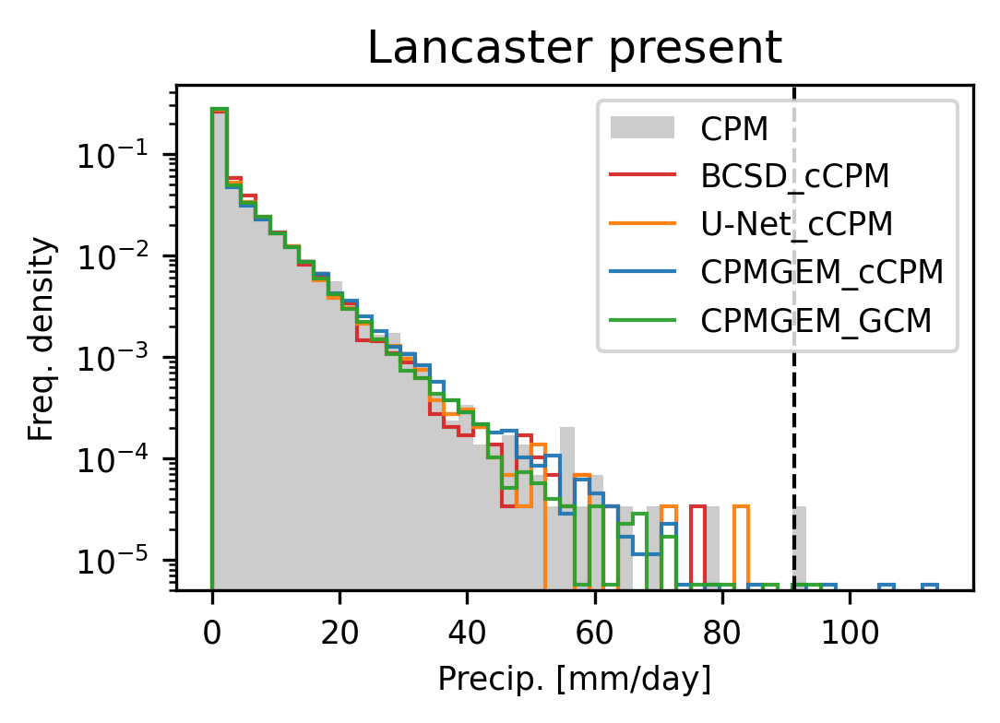

In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"#### {var}", raw=True)
    
    metrics_ds = xr.concat([
            xr.concat([ _metrics(label, q, tp_ds, DIST_THRESHOLDS[var]) for label, q in BOX_LOCATIONS.items() ], dim="location").expand_dims({"time_period": [tp]})
         for tp, tp_ds in VAR_DAS[var].groupby("time_period") ], 
        dim="time_period"
    )

    pretty_table(metrics_ds, round=4)
    
    for label, q in BOX_LOCATIONS.items():
        ds = VAR_DAS[var].cf.sel(**q, method="nearest")
        for tp, tp_ds in ds.groupby("time_period"):
            pred_da = tp_ds[f"pred_{var}"]
            cpm_da = tp_ds[f"target_{var}"]
    
            fig = plt.figure(layout="constrained", figsize=(3.5, 2.5))
            ax = plot_freq_density_figure(pred_da, cpm_da, MODELLABEL2SPEC, fig)
            ax.axvline(x=cpm_da.max(), color='k', linestyle='--', linewidth=1)
            ax.set_title(f"{label} {tp}")
            
            plt.show()

### Individual QQ plots

#### pr

-4


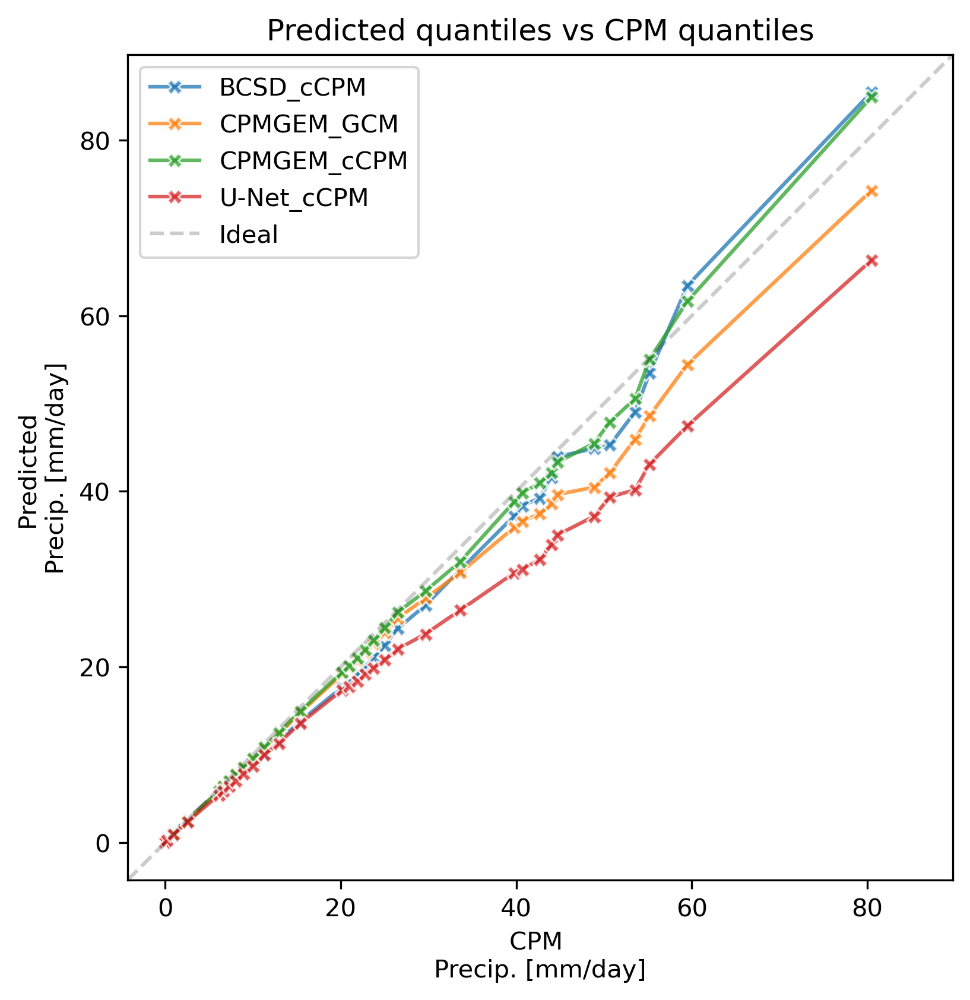

-4


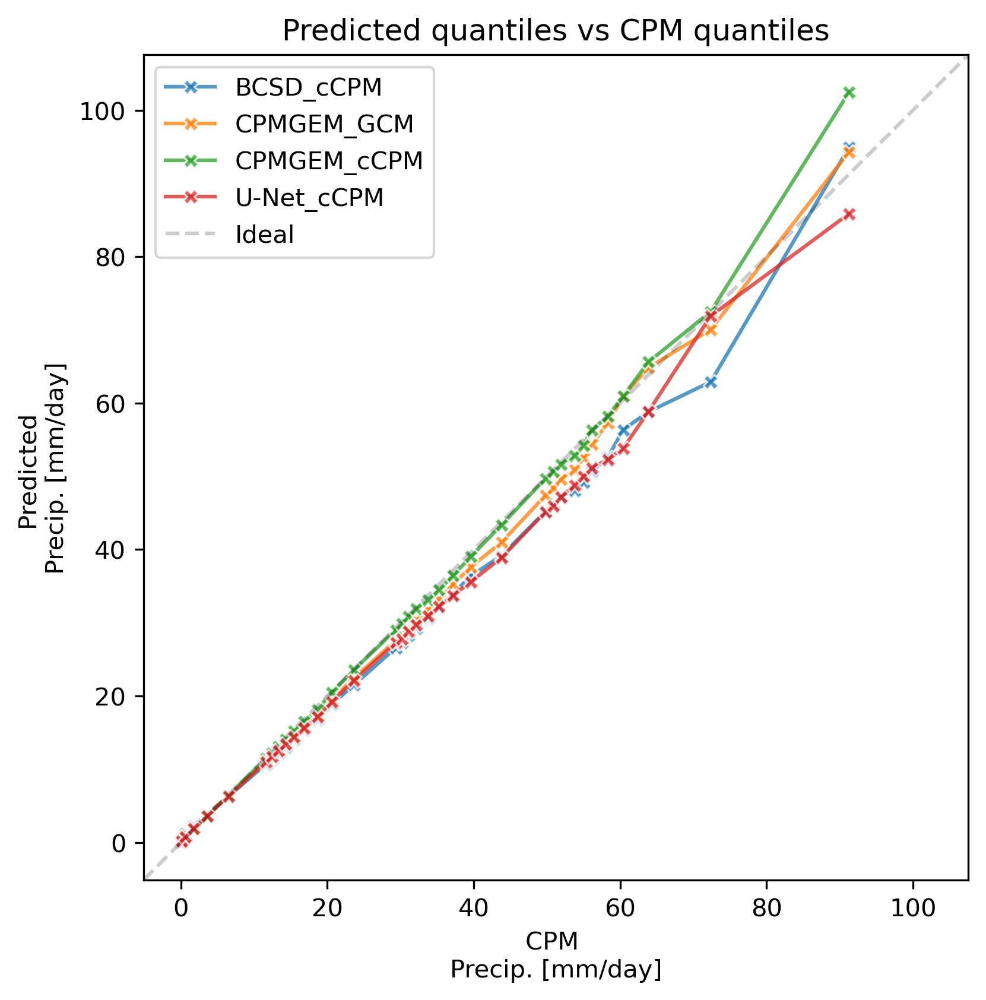

In [ ]:
quantile_dims=["ensemble_member", "time"]

for var in eval_vars:
    IPython.display.display_markdown(f"#### {var}", raw=True)
    for label, q in BOX_LOCATIONS.items():
        ds = VAR_DAS[var].cf.sel(**q, method="nearest")
        pred_da = ds[f"pred_{var}"]
        cpm_da = ds[f"target_{var}"]
        
        quantiles = reasonable_quantiles(cpm_da)
        cpm_quantiles = cpm_da.quantile(quantiles, dim=quantile_dims).rename("target_q")
    
        pred_quantiles = pred_da.quantile(quantiles, dim=quantile_dims).rename("pred_q")

        layout="constrained"

        fig, ax = plt.subplots(figsize=(5.5, 5.5), layout="constrained")

        xlabel = f"CPM \n{xr.plot.utils.label_from_attrs(da=cpm_da)}"
        ylabel = f"Predicted \n{xr.plot.utils.label_from_attrs(da=pred_da)}"

        qq_plot(ax, cpm_quantiles, pred_quantiles, title=f"Predicted quantiles vs CPM quantiles", xlabel=xlabel, ylabel=ylabel)

        plt.show()

## Figure: Threshold exceedence

Threshold: 0.1mm/day 
 
 
   
   
 % Threshold exceeded 
 
 
 season 
 model 
   
 
 
 
 
 Annual 
 BCSD_cCPM 
 65.9 
 
 
 CPMGEM_GCM 
 54.7 
 
 
 CPMGEM_cCPM 
 52.6 
 
 
 U-Net_cCPM 
 56.5 
 
 
 CPM 
 53.0 
 
 
 DJF 
 BCSD_cCPM 
 78.8 
 
 
 CPMGEM_GCM 
 68.1 
 
 
 CPMGEM_cCPM 
 66.4 
 
 
 U-Net_cCPM 
 68.6 
 
 
 CPM 
 67.4 
 
 
 MAM 
 BCSD_cCPM 
 68.0 
 
 
 CPMGEM_GCM 
 58.9 
 
 
 CPMGEM_cCPM 
 56.2 
 
 
 U-Net_cCPM 
 58.4 
 
 
 CPM 
 55.7 
 
 
 JJA 
 BCSD_cCPM 
 51.2 
 
 
 CPMGEM_GCM 
 38.4 
 
 
 CPMGEM_cCPM 
 36.9 
 
 
 U-Net_cCPM 
 45.5 
 
 
 CPM 
 36.9 
 
 
 SON 
 BCSD_cCPM 
 65.6 
 
 
 CPMGEM_GCM 
 53.2 
 
 
 CPMGEM_cCPM 
 50.8 
 
 
 U-Net_cCPM 
 53.6 
 
 
 CPM 
 52.0

#### Threshold: 0.1mm/day

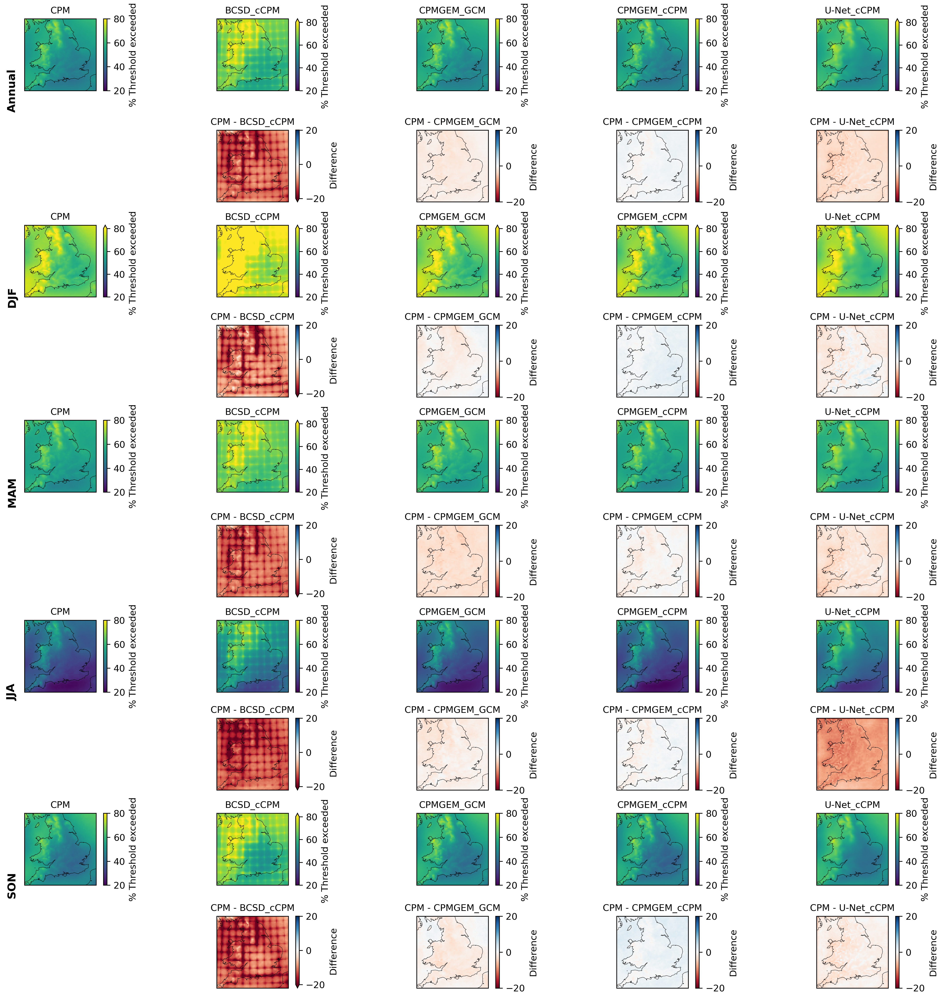

In [ ]:
for var, thresholds in THRESHOLDS.items():
    if var in eval_vars:
        model_das = [
            EVAL_DS[source][f"pred_{var}"].sel(model=model)
            for source, mconfigs in MODELS.items() for model, spec in mconfigs.items()
        ]

        threshold_exceeded_stats = { threshold: threshold_exceeded_prop_stats(VAR_DAS[var][f"pred_{var}"], CPM_DAS[var], threshold) for threshold in thresholds }

        dfs = [threshold_exceeded_stats[threshold].mean(dim=["grid_latitude", "grid_longitude"]).to_dataframe().style.set_table_attributes("style='display:inline'").set_caption(f"Threshold: {threshold}{CPM_DAS[var].attrs['units']}").format(precision=1).to_html() for threshold in thresholds]

        IPython.display.display_html(functools.reduce(lambda v, e: v+e, dfs), raw=True)

        for threshold in thresholds:
            IPython.display.display_markdown(f"#### Threshold: {threshold}{CPM_DAS[var].attrs['units']}", raw=True)

            plot_threshold_exceedence_errors(threshold_exceeded_stats[threshold])

            plt.show()

## Rough: wet-day mean

#### Threshold: 0.1mm/day

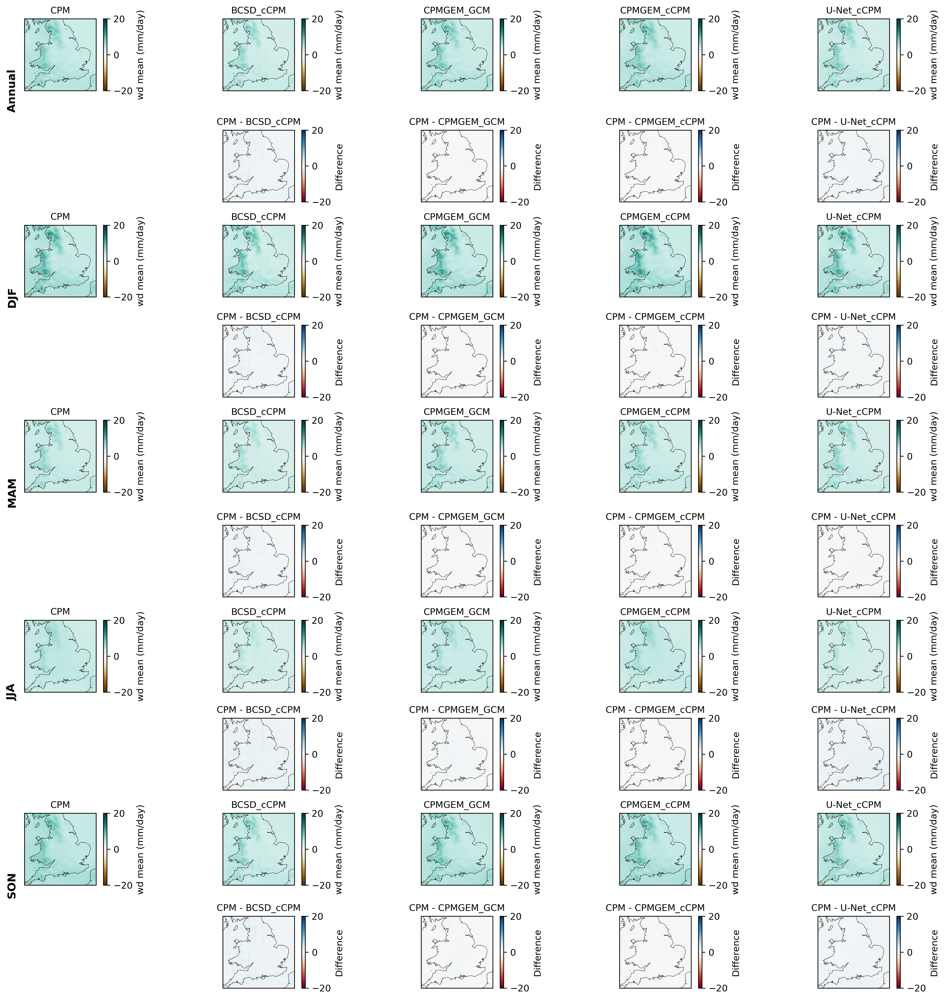

In [ ]:
model_das = [
    EVAL_DS[source]["pred_pr"].sel(model=model)
    for source, mconfigs in MODELS.items() for model, spec in mconfigs.items()
]

change_stats = { var: { threshold: threshold_exceeded_prop_stats(VAR_DAS[var][f"pred_{var}"], CPM_DAS[var], threshold=threshold, threshold_exceeded_prop_statistic=wd_mean) for threshold in thresholds } for var, thresholds in THRESHOLDS.items() if var in eval_vars }

for var, thresholds in THRESHOLDS.items():
    if var in eval_vars:
        for threshold in thresholds:
            IPython.display.display_markdown(f"#### Threshold: {threshold}mm/day", raw=True)
            
            plot_threshold_exceedence_errors(change_stats[var][threshold], style="change")
        
            plt.show()